# 球面上的均匀分布随机坐标点的直接抽样法
Let $\rho=1$, then $1=\frac{1}{4 \pi} \int_{0}^{2 \pi} \int_{0}^{\pi} \sin \theta d \theta d \varphi, P(\theta, \varphi)=\frac{\sin \theta}{4 \pi}$.

Hence, $P(\varphi)=\frac{1}{2 \pi}, \quad P(\theta)=\frac{\sin \theta}{2}$, and
$\xi=\frac{\varphi}{2 \pi} \quad, \eta=\frac{1-\cos \theta}{2}$, where $\xi,\eta$ are drawn from uniform distribution on [0, 1]

$\varphi=2 \pi \xi, \quad \theta=\operatorname{arcos}(1-2 \eta)$

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
import time

In [17]:
start = time.time()
phi = np.random.rand(50000) * (2 * np.pi)
theta = np.arccos(1 - 2 * np.random.rand(50000))
x = np.sin(theta) * np.cos(phi)
y = np.sin(theta) * np.sin(phi)
z = np.cos(theta)
print(f'Elapsed Time: {time.time() - start}')

Elapsed Time: 0.006803274154663086


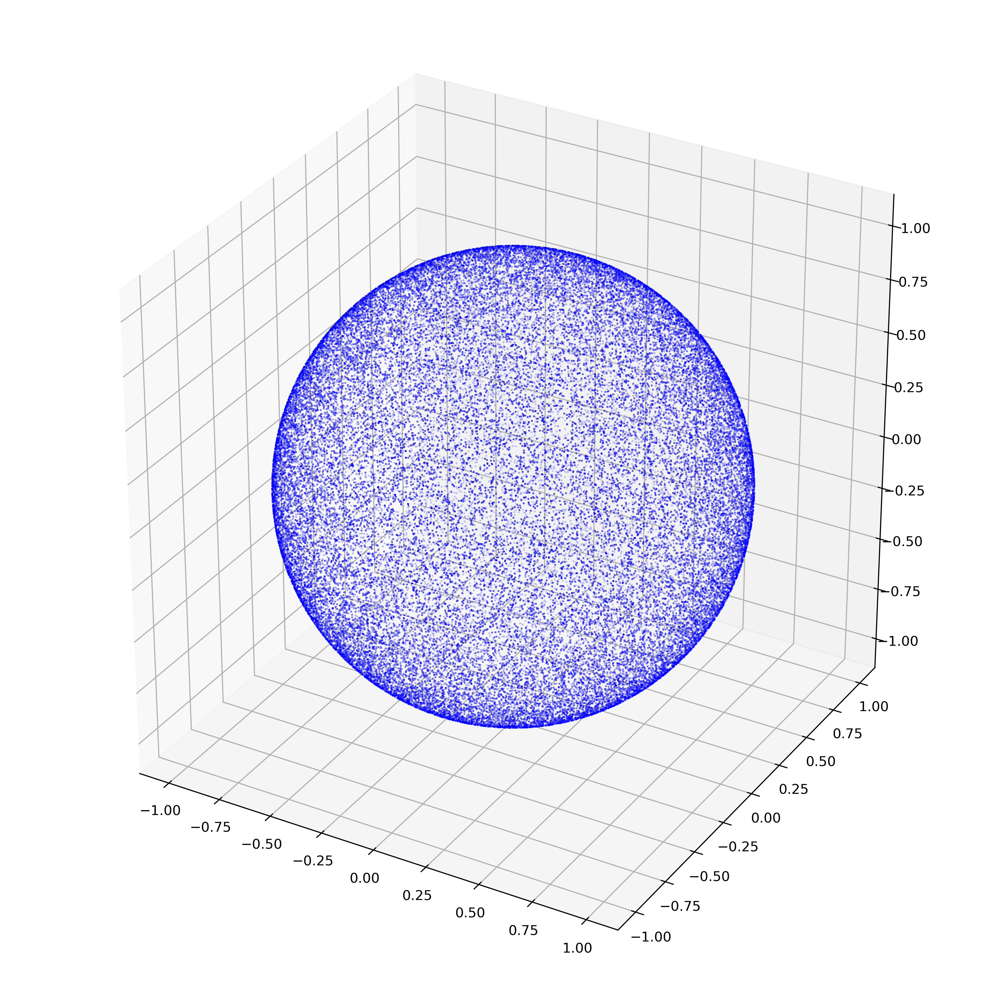

In [12]:
fig = plt.figure(figsize=(10,10), dpi=300)
ax = Axes3D(fig)
ax.scatter(x, y, z, c='b', s=0.1)
plt.show()

# Marsaglia抽样方法的正确性
球面上的均匀采样在平面上的投影，只计算上半球面的投影

$\mathrm{P}(\varphi)=\frac{1}{2 \pi}(\varphi \in[0,2 \pi]) \quad, \mathrm{P}(\theta)=\sin \theta\left(\theta \epsilon\left[0, \frac{\pi}{2}\right]\right) \cdot \mathrm{P}(\theta, \varphi)=\frac{\sin \theta}{2 \pi}$

$x=\sin \theta \cos \varphi, \quad y=\sin \theta \sin \varphi$

$P(x, y)=\left|\frac{\partial(\theta, \varphi)}{\partial(x, y)}\right| P(\theta, \varphi)=$
$\left|\begin{array}{cc}\frac{x}{\sqrt{1-\left(x^{2}+y^{2}\right)} \sqrt{x^{2}+y^{2}}} & \frac{y}{\sqrt{1-\left(x^{2}+y^{2}\right)} \sqrt{x^{2}+y^{2}}} \\ \frac{y}{x^{2}+y^{2}} & \frac{-x}{x^{2}+y^{2}}\end{array}\right| \frac{\sin \theta}{2 \pi}=\frac{1}{\sqrt{1-\left(x^{2}+y^{2}\right)} \sqrt{x^{2}+y^{2}}} \frac{\sin \theta}{2 \pi}=\frac{1}{2 \pi \sqrt{1-\left(x^{2}+y^{2}\right)}}$

For Marsaglia, let $z=1-2r^2>0, r^2<\frac{1}{2}$
$$
\begin{array}{l}
x=2 \cos \varphi r \sqrt{1-r^{2}}, y=2 \sin \varphi r \sqrt{1-r^{2}} \\
x^{2}+y^{2}=4 r^{2}\left(1-r^{2}\right), r^{2}=\frac{1}{2}(1-\sqrt{1-\left(x^{2}+y^{2}\right)}) \\
\varphi=\arctan \left(\frac{x}{y}\right) \\
P(r)=4 r\left(r \in\left[0, \frac{1}{\sqrt{2}}\right]\right), P\left(r^{2}\right)=\frac{4 r}{2 \sqrt{r^{2}}}=2, P(\varphi)=\frac{1}{2 \pi} \\
P(x, y)=\left|\frac{\partial\left(r^{2}, \varphi\right)}{\partial(x, y)}\right| P\left(r^{2}, \varphi\right)=\frac{1}{2 \sqrt{1-\left(x^{2}+y^{2}\right)}} \frac{2}{2 \pi}=\frac{1}{2 \pi \sqrt{1-\left(x^{2}+y^{2}\right)}}
\end{array}
$$

In [18]:
start = time.time()
u = np.random.rand(int(50000 * 4 / np.pi)) * 2 - 1
v = np.random.rand(int(50000 * 4 / np.pi)) * 2 - 1
r_square = np.square(u) + np.square(v)
index = r_square <= 1
u = u[index]
v = v[index]
r_square = r_square[index]
x = 2 * u * np.sqrt(1 - r_square)
y = 2 * v * np.sqrt(1 - r_square)
z = 1 - 2 * r_square
print(f'Elapsed Time: {time.time() - start}')

Elapsed Time: 0.005764961242675781


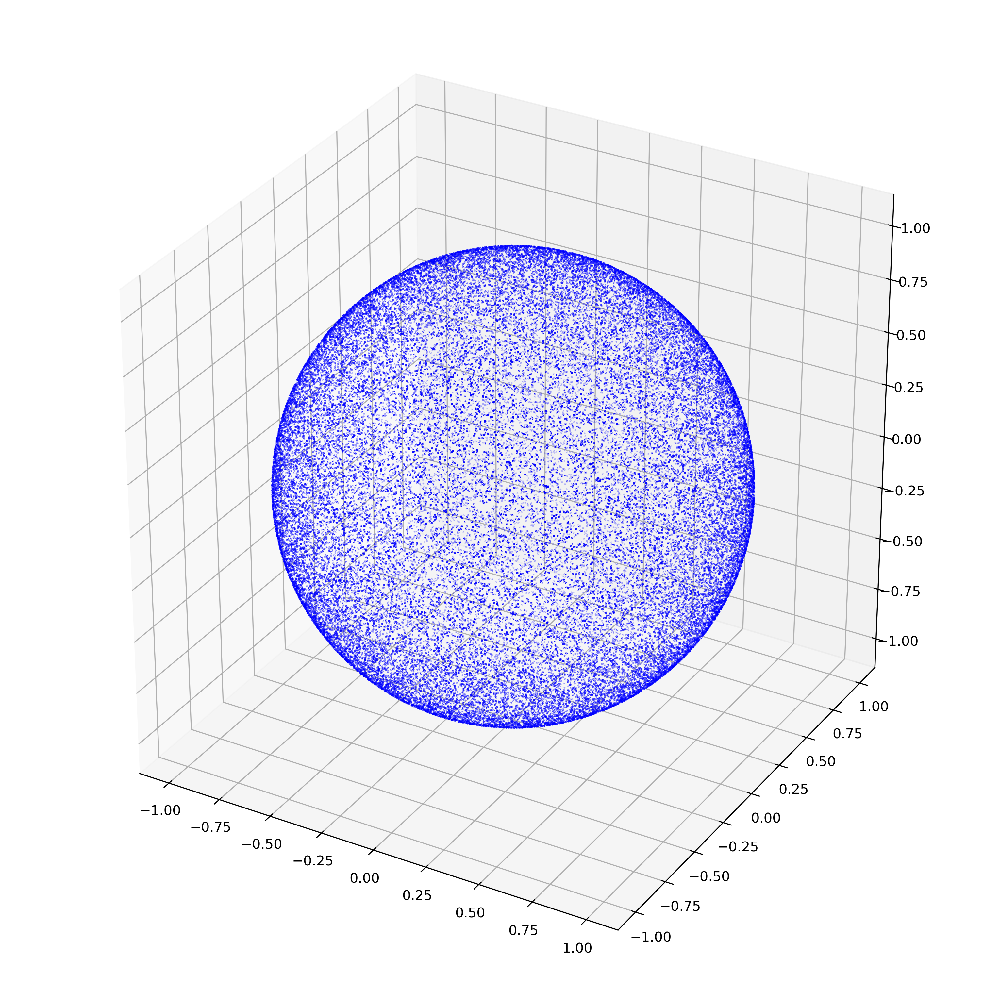

In [14]:
fig = plt.figure(figsize=(10,10), dpi=300)
ax = Axes3D(fig)
ax.scatter(x, y, z, c='b', s=0.1)
plt.show()